In [1]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model, Sequential
from keras.utils import to_categorical, plot_model
from keras import backend as K


from sklearn.model_selection import train_test_split


from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt

Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.


In [5]:
(x_train, _), (x_test, _) = mnist.load_data()

x_train = x_train.astype('float32') / 255.
print(x_train.shape)
x_test = x_test.astype('float32') / 255.
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))  # adapt this if using `channels_first` image data format
print(x_train.shape)
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))  # adapt this if using `channels_first` image data format
noise_factor = .5

x_train_noisy = x_train + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_train.shape) 
x_test_noisy = x_test + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=x_test.shape) 

x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

(60000, 28, 28)
(60000, 28, 28, 1)


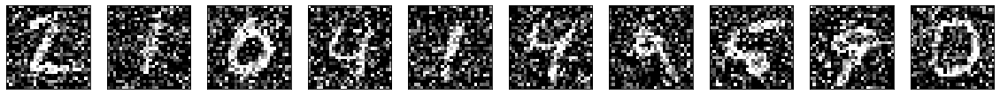

In [6]:
n = 10
plt.figure(figsize=(20, 2))
for i in range(n):
    i=i+1
    ax = plt.subplot(1, n, i)
    plt.imshow(x_test_noisy[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [7]:
input_img = Input(shape=(28, 28, 1))  # adapt this if using `channels_first` image data format

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (7, 7, 32)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

DAE = Model(input_img, decoded)
plot_model(DAE, to_file='DAE_plot.png', show_shapes=True)

DAE.compile(optimizer='adadelta', loss='binary_crossentropy')

In [8]:
from keras.callbacks import TensorBoard
DAE_history = DAE.fit(x_train_noisy, x_train,
                epochs=100,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test_noisy, x_test),
                callbacks=[TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)])

Train on 60000 samples, validate on 10000 samples
Epoch 1/100
60000/60000 [==============================] - 9s 146us/step - loss: 0.1807 - val_loss: 0.1352
Epoch 2/100
60000/60000 [==============================] - 8s 137us/step - loss: 0.1201 - val_loss: 0.1133
Epoch 3/100
60000/60000 [==============================] - 8s 139us/step - loss: 0.1122 - val_loss: 0.1070
Epoch 4/100
60000/60000 [==============================] - 8s 135us/step - loss: 0.1082 - val_loss: 0.1058
Epoch 5/100
60000/60000 [==============================] - 8s 133us/step - loss: 0.1056 - val_loss: 0.1041
Epoch 6/100
60000/60000 [==============================] - 8s 133us/step - loss: 0.1040 - val_loss: 0.1026
Epoch 7/100
60000/60000 [==============================] - 8s 136us/step - loss: 0.1027 - val_loss: 0.1006
Epoch 8/100
60000/60000 [==============================] - 8s 135us/step - loss: 0.1020 - val_loss: 0.10140s - loss: 0.1
Epoch 9/100
60000/60000 [==============================] - 8s 131us/step - loss:

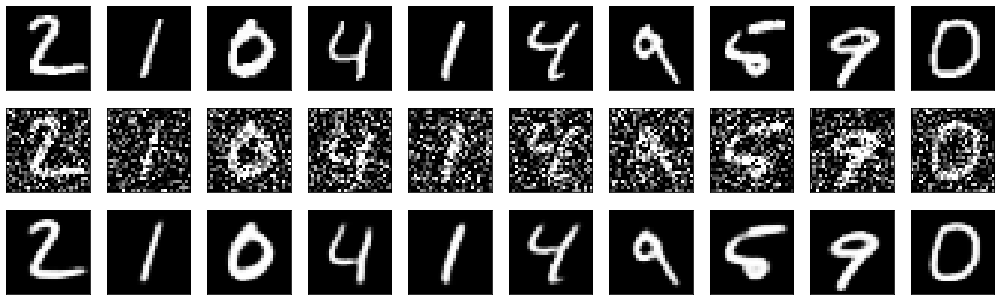

In [10]:
decoded_imgs = DAE.predict(x_test)

n = 10
plt.figure(figsize=(20, 6))
for i in range(n):
    i=i+1
    # display original
    # display original
    ax = plt.subplot(3, n, i)
    plt.imshow(x_test[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    ax = plt.subplot(3, n, i + n)
    plt.imshow(x_test_noisy[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(3, n, i +n+n)
    plt.imshow(decoded_imgs[i].reshape(28, 28))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

# Applied process

In [1]:
import os
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
from keras.callbacks import TensorBoard, ModelCheckpoint

from keras import optimizers
from keras.layers import (Input, Dense, Conv2D, MaxPooling2D, 
                          UpSampling2D, Activation, Dropout)
from keras.models import Model, Sequential
from keras.utils import to_categorical, plot_model
from keras import backend as K

import cv2

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

Using TensorFlow backend.


In [2]:
K.clear_session()

In [3]:
import tensorflow as tf
from keras.backend.tensorflow_backend import set_session
config = tf.ConfigProto()
config.gpu_options.allow_growth = True  # dynamically grow the memory used on the GPU
config.log_device_placement = True  # to log device placement (on which device the operation ran)
                                    # (nothing gets printed in Jupyter, only if you run it standalone)
sess = tf.Session(config=config)
set_session(sess) 

In [4]:
def list_tfrecord_file(file_list):
    tfrecord_list = []
    for root, dirs, files in os.walk(DIR):
        path = root.split(os.sep)
        for file in files:
            if '.jpeg' in file:
                tfrecord_list.append(file)
                #print("Found %s successfully!" % file)
            else:
                pass
    return tfrecord_list

def tfrecord_auto_traversal(directory):
    current_folder_filename_list = os.listdir(directory) # Change this PATH to traverse other directories if you want.
    if current_folder_filename_list != None:
        print("%s files were found under current folder. " % len(current_folder_filename_list))
        print("Please be noted that only files end with '*.jpeg' will be load!")
        tfrecord_list = list_tfrecord_file(current_folder_filename_list)
        if len(tfrecord_list) == 0:
            print("Cannot find any jpeg files, please check the path.")
            
    return tfrecord_list

def imageLoader(files, batch_size):

    L = len(files)

    #this line is just to make the generator infinite, keras needs that    
    while True:

        batch_start = 0
        batch_end = batch_size

        while batch_start < L:
            limit = min(batch_end, L)
            X = someMethodToLoadImages(files[batch_start:limit])
            Y = someMethodToLoadTargets(files[batch_start:limit])

            yield (X,Y) #a tuple with two numpy arrays with batch_size samples     

            batch_start += batch_size   
            batch_end += batch_size

def create_batches(batch_size, list_of_images):
    images = []
    for img in list_of_images:
        images.append(misc.imread(img))
    images = np.asarray(images)

  #do something similar for the labels

    while (True):
        for i in range(0,total,batch_size):
            yield(images[i:i+batch_size],labels[i:i+batch_size])
            
def crop_center(img,cropx,cropy):
    (y,x,_) = img.shape
    startx = x//2-(cropx//2)
    starty = y//2-(cropy//2)    
    return img[starty:starty+cropy,startx:startx+cropx]

def print_images(img):
    fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(8, 5),
                       sharex=True, sharey=True)

    plt.gray()


    # Estimate the average noise standard deviation across color channels.
    sigma_est = estimate_sigma(img, multichannel=False, average_sigmas=True)
    # Due to clipping in random_noise, the estimate will be a bit smaller than the
    # specified sigma.
    print("Estimated Gaussian noise standard deviation = {}".format(sigma_est))

    ax[0, 0].imshow(img)
    ax[0, 0].axis('off')
    ax[0, 0].set_title('red')
    ax[0, 1].imshow(denoise_tv_chambolle(img, weight=0.1, multichannel=False))
    ax[0, 1].axis('off')
    ax[0, 1].set_title('TV')
    ax[0, 2].imshow(denoise_bilateral(img, sigma_color=0.05, sigma_spatial=15,
                    multichannel=False))
    ax[0, 2].axis('off')
    ax[0, 2].set_title('Bilateral')
    ax[0, 3].imshow(denoise_wavelet(img, multichannel=False))
    ax[0, 3].axis('off')
    ax[0, 3].set_title('Wavelet denoising')

    ax[1, 1].imshow(denoise_tv_chambolle(img, weight=0.2, multichannel=False))
    ax[1, 1].axis('off')
    ax[1, 1].set_title('(more) TV')
    ax[1, 2].imshow(denoise_bilateral(img, sigma_color=0.1, sigma_spatial=15,
                    multichannel=False))
    ax[1, 2].axis('off')
    ax[1, 2].set_title('(more) Bilateral')
    ax[1, 3].imshow(denoise_wavelet(img, multichannel=False, convert2ycbcr=True))
    ax[1, 3].axis('off')
    ax[1, 3].set_title('Wavelet denoising\nin YCbCr colorspace')
    ax[1, 0].imshow(img)
    ax[1, 0].axis('off')
    ax[1, 0].set_title('Original')

    fig.tight_layout()

    plt.show()

In [5]:
SET_SIZE = 512
noise_factor = .3
final_data=np.array([])

switch=1
tfrecord_list = tfrecord_auto_traversal(DIR)
for image in tfrecord_list[:500]:
    img = cv2.imread(DIR+"\\"+image)
    if(img.shape[0]>img.shape[1]): 
        res = cv2.resize(img,dsize=(int(img.shape[0]/img.shape[1]*SET_SIZE),SET_SIZE), interpolation=cv2.INTER_CUBIC)
        switch=0
    else:
        res = cv2.resize(img,dsize=(int(img.shape[1]/img.shape[0]*SET_SIZE),SET_SIZE), interpolation=cv2.INTER_CUBIC)
    res = crop_center(res,SET_SIZE,SET_SIZE)
    res = res.astype('float32') / 255.
    res = cv2.cvtColor(res,cv2.COLOR_BGR2GRAY)
    final_data = np.append(final_data,res)


5845 files were found under current folder. 
Please be noted that only files end with '*.jpeg' will be load!


In [6]:
final_data = np.reshape(final_data,(int(len(final_data)/(SET_SIZE*SET_SIZE)),SET_SIZE,SET_SIZE,1))

In [7]:
train_size = int(len(final_data)*.90)

X_train = final_data[:train_size]
X_test = final_data[train_size:]

X_train_noisy = X_train + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_train.shape) 
X_test_noisy = X_test + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_test.shape) 

X_train_noisy = np.clip(X_train_noisy, 0., 1.)
X_test_noisy = np.clip(X_test_noisy, 0., 1.)

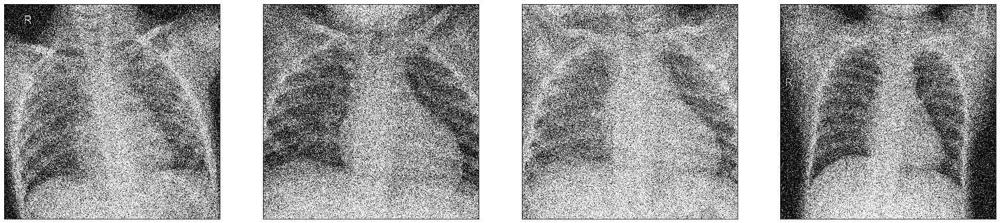

In [8]:
n = 4
plt.figure(figsize=(30, 10))
for i in range(n):
    i=i+1
    ax = plt.subplot(1, n, i)
    plt.imshow(X_test_noisy[i].reshape(SET_SIZE, SET_SIZE))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [9]:
input_img = Input(shape=(SET_SIZE, SET_SIZE, 1))  # adapt this if using `channels_first` image data format

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (128, 128, 32)

x = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

DAE = Model(input_img, decoded)
plot_model(DAE, to_file='DAE_xray_plot.png', show_shapes=True)

DAE.load_weights('models_512')
adam = optimizers.adam(lr=0.0001)
DAE.compile(optimizer=adam, loss='binary_crossentropy', metrics=['accuracy'])

Instructions for updating:
Colocations handled automatically by placer.


In [10]:
save_dir = './models_512'

checkpoint = ModelCheckpoint(save_dir, monitor='val_loss', verbose=1, save_best_only=True, mode='min',period=10)
tensor_board = TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)
callbacks_list = [tensor_board,checkpoint]

DAE_history = DAE.fit(X_train_noisy, X_train,
                epochs=150,
                batch_size=12,
                shuffle=True,
                validation_data=(X_test_noisy, X_test),
                callbacks=callbacks_list)

Instructions for updating:
Use tf.cast instead.
Train on 450 samples, validate on 50 samples
Epoch 1/150
450/450 [==============================] - 13s 28ms/step - loss: 0.6071 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 2/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 3/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 4/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 5/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 6/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 7/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val

450/450 [==============================] - 9s 20ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 116/150
450/450 [==============================] - 9s 20ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 117/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 118/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 119/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 120/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127

Epoch 00120: val_loss did not improve from 0.60708
Epoch 121/150
450/450 [==============================] - 9s 19ms/step - loss: 0.6070 - acc: 0.0115 - val_loss: 0.6071 - val_acc: 0.0127
Epoch 122/

In [10]:
input_img = Input(shape=(SET_SIZE, SET_SIZE, 1))  # adapt this if using `channels_first` image data format

input_size = SET_SIZE * SET_SIZE
hidden_units = 256 # These are the number of neurons in each MLP layer
dropout = 0.45 # Dropout is a form of regularization, that make neural networks more robust to new unseen test input data

               # Dropout is not used in the output layer and is only used during model training.

               # Dropout is not present when making predictions on test data.



# model is a 3-layer MLP with ReLU and dropout after each layer

DAE_stand = Sequential()
DAE_stand.add(Dense(hidden_units, input_dim=input_size)) #The 1st MLP Layer. Only the first layer has input_dim specified as an argument. 
DAE_stand.add(Activation('relu')) 
DAE_stand.add(Dropout(dropout))  #First MLP Layer has 256 hidden units, post dropout, (1 - 0.45) * 256 = 140 hidden units participate in layer 2 from 1 
DAE_stand.add(Dense(hidden_units))
DAE_stand.add(Activation('relu'))
DAE_stand.add(Dropout(dropout)) #Second MLP Layer has 140 hidden units, post dropout, (1 - 0.45) * 140 = 91 hidden units participate in layer 3 from 2 
DAE_stand.add(Dense(input_size)) #Then we map to the output length for the number of labels, 10.
# this is the output for one-hot vector
DAE_stand.add(Activation('sigmoid')) # softmax squashes the outputs to predicted probabilities of each class that sum to 1. The highest probability 
DAE_stand.summary()                  # The highest probability 

plot_model(DAE_stand, to_file='DAE_standard_xray_plot.png', show_shapes=True)

DAE_stand.load_weights('models_512_standard')
adam = optimizers.adam(lr=0.0001)
DAE_stand.compile(optimizer=adam, loss='binary_crossentropy', metrics=['accuracy'])

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               67109120  
_________________________________________________________________
activation_1 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               65792     
_________________________________________________________________
activation_2 (Activation)    (None, 256)               0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
___________________________

In [11]:
X_train_noisy_reshape = np.reshape(X_train_noisy, [-1, input_size])
X_train_reshape = np.reshape(X_train, [-1, input_size])

X_test_noisy_reshape = np.reshape(X_test_noisy, [-1, input_size])
X_test_reshape = np.reshape(X_test, [-1, input_size])

In [13]:
save_dir = './models_512_standard'



checkpoint = ModelCheckpoint(save_dir, monitor='val_loss', verbose=1, save_best_only=True, mode='min',period=10)
tensor_board = TensorBoard(log_dir='/tmp/tb', histogram_freq=0, write_graph=False)
callbacks_list = [tensor_board,checkpoint]

DAE_stand_history = DAE_stand.fit(X_train_noisy_reshape, X_train_reshape,
                epochs=1500,
                batch_size=40,
                shuffle=True,
                validation_data=(X_test_noisy_reshape, X_test_reshape),
                callbacks=callbacks_list)

Train on 450 samples, validate on 50 samples
Epoch 1/1500
450/450 [==============================] - 5s 11ms/step - loss: 0.6913 - acc: 0.0063 - val_loss: 0.6745 - val_acc: 0.0100
Epoch 2/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6686 - acc: 0.0089 - val_loss: 0.6508 - val_acc: 0.0115
Epoch 3/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6563 - acc: 0.0098 - val_loss: 0.6464 - val_acc: 0.0115
Epoch 4/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6538 - acc: 0.0101 - val_loss: 0.6484 - val_acc: 0.0116
Epoch 5/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6539 - acc: 0.0102 - val_loss: 0.6491 - val_acc: 0.0117
Epoch 6/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6524 - acc: 0.0103 - val_loss: 0.6455 - val_acc: 0.0117
Epoch 7/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6516 - acc: 0.0103 - val_loss: 0.6470 - val_acc: 0.0117
Epoch 8/15

Epoch 116/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6403 - acc: 0.0108 - val_loss: 0.6491 - val_acc: 0.0124
Epoch 117/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6393 - acc: 0.0109 - val_loss: 0.6483 - val_acc: 0.0124
Epoch 118/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6408 - acc: 0.0108 - val_loss: 0.6492 - val_acc: 0.0124
Epoch 119/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6400 - acc: 0.0108 - val_loss: 0.6496 - val_acc: 0.0124
Epoch 120/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6405 - acc: 0.0109 - val_loss: 0.6476 - val_acc: 0.0124

Epoch 00120: val_loss did not improve from 0.64543
Epoch 121/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6410 - acc: 0.0108 - val_loss: 0.6487 - val_acc: 0.0124
Epoch 122/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6408 - acc: 0.0109 - val_loss: 0.6493 - val_acc: 0.

Epoch 174/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6406 - acc: 0.0106 - val_loss: 0.6479 - val_acc: 0.0124
Epoch 175/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6389 - acc: 0.0110 - val_loss: 0.6484 - val_acc: 0.0124
Epoch 176/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6401 - acc: 0.0109 - val_loss: 0.6466 - val_acc: 0.0124
Epoch 177/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6399 - acc: 0.0108 - val_loss: 0.6484 - val_acc: 0.0124
Epoch 178/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6395 - acc: 0.0109 - val_loss: 0.6491 - val_acc: 0.0124
Epoch 179/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6398 - acc: 0.0110 - val_loss: 0.6499 - val_acc: 0.0125
Epoch 180/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6409 - acc: 0.0109 - val_loss: 0.6489 - val_acc: 0.0125

Epoch 00180: val_loss did not improve from 0.6

Epoch 232/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6396 - acc: 0.0109 - val_loss: 0.6480 - val_acc: 0.0124
Epoch 233/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6393 - acc: 0.0110 - val_loss: 0.6464 - val_acc: 0.0124
Epoch 234/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6389 - acc: 0.0110 - val_loss: 0.6489 - val_acc: 0.0125
Epoch 235/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6391 - acc: 0.0110 - val_loss: 0.6493 - val_acc: 0.0125
Epoch 236/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6398 - acc: 0.0108 - val_loss: 0.6472 - val_acc: 0.0124
Epoch 237/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6398 - acc: 0.0109 - val_loss: 0.6486 - val_acc: 0.0124
Epoch 238/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6403 - acc: 0.0109 - val_loss: 0.6478 - val_acc: 0.0124
Epoch 239/1500
450/450 [====================

Epoch 290/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6402 - acc: 0.0109 - val_loss: 0.6482 - val_acc: 0.0124

Epoch 00290: val_loss did not improve from 0.64543
Epoch 291/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6417 - acc: 0.0107 - val_loss: 0.6486 - val_acc: 0.0124
Epoch 292/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6409 - acc: 0.0108 - val_loss: 0.6478 - val_acc: 0.0125
Epoch 293/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6407 - acc: 0.0108 - val_loss: 0.6470 - val_acc: 0.0124
Epoch 294/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6402 - acc: 0.0109 - val_loss: 0.6474 - val_acc: 0.0124
Epoch 295/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6412 - acc: 0.0108 - val_loss: 0.6475 - val_acc: 0.0124
Epoch 296/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6400 - acc: 0.0108 - val_loss: 0.6481 - val_acc:

450/450 [==============================] - 4s 9ms/step - loss: 0.6413 - acc: 0.0107 - val_loss: 0.6454 - val_acc: 0.0124
Epoch 405/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6399 - acc: 0.0108 - val_loss: 0.6453 - val_acc: 0.0124
Epoch 406/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6405 - acc: 0.0109 - val_loss: 0.6440 - val_acc: 0.0124
Epoch 407/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6400 - acc: 0.0108 - val_loss: 0.6443 - val_acc: 0.0124
Epoch 408/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6402 - acc: 0.0109 - val_loss: 0.6451 - val_acc: 0.0124
Epoch 409/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6398 - acc: 0.0108 - val_loss: 0.6454 - val_acc: 0.0124
Epoch 410/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6405 - acc: 0.0109 - val_loss: 0.6456 - val_acc: 0.0124

Epoch 00410: val_loss did not improve from 0.64540
Epoch 4

Epoch 461/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6395 - acc: 0.0110 - val_loss: 0.6449 - val_acc: 0.0125
Epoch 462/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6398 - acc: 0.0109 - val_loss: 0.6444 - val_acc: 0.0124
Epoch 463/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6402 - acc: 0.0107 - val_loss: 0.6443 - val_acc: 0.0124
Epoch 464/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6389 - acc: 0.0109 - val_loss: 0.6452 - val_acc: 0.0124
Epoch 465/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6398 - acc: 0.0109 - val_loss: 0.6460 - val_acc: 0.0124
Epoch 466/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6390 - acc: 0.0109 - val_loss: 0.6444 - val_acc: 0.0124
Epoch 467/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6399 - acc: 0.0110 - val_loss: 0.6443 - val_acc: 0.0124
Epoch 468/1500
450/450 [==================

Epoch 576/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6393 - acc: 0.0109 - val_loss: 0.6448 - val_acc: 0.0124
Epoch 577/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6390 - acc: 0.0110 - val_loss: 0.6442 - val_acc: 0.0124
Epoch 578/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6399 - acc: 0.0108 - val_loss: 0.6445 - val_acc: 0.0124
Epoch 579/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6396 - acc: 0.0109 - val_loss: 0.6430 - val_acc: 0.0124
Epoch 580/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6391 - acc: 0.0110 - val_loss: 0.6438 - val_acc: 0.0125

Epoch 00580: val_loss did not improve from 0.64335
Epoch 581/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6388 - acc: 0.0109 - val_loss: 0.6455 - val_acc: 0.0124
Epoch 582/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6393 - acc: 0.0108 - val_loss: 0.6447 - val_acc: 0.0

450/450 [==============================] - 4s 9ms/step - loss: 0.6394 - acc: 0.0108 - val_loss: 0.6433 - val_acc: 0.0124
Epoch 692/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6379 - acc: 0.0110 - val_loss: 0.6425 - val_acc: 0.0124
Epoch 693/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6386 - acc: 0.0110 - val_loss: 0.6424 - val_acc: 0.0124
Epoch 694/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6386 - acc: 0.0110 - val_loss: 0.6426 - val_acc: 0.0124
Epoch 695/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6384 - acc: 0.0109 - val_loss: 0.6430 - val_acc: 0.0125
Epoch 696/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6390 - acc: 0.0108 - val_loss: 0.6421 - val_acc: 0.0124
Epoch 697/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6387 - acc: 0.0109 - val_loss: 0.6424 - val_acc: 0.0124
Epoch 698/1500
450/450 [==============================] - 4s 9m

450/450 [==============================] - 4s 10ms/step - loss: 0.6378 - acc: 0.0110 - val_loss: 0.6416 - val_acc: 0.0124
Epoch 807/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6384 - acc: 0.0107 - val_loss: 0.6422 - val_acc: 0.0124
Epoch 808/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6381 - acc: 0.0109 - val_loss: 0.6418 - val_acc: 0.0124
Epoch 809/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6379 - acc: 0.0109 - val_loss: 0.6416 - val_acc: 0.0124
Epoch 810/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6391 - acc: 0.0109 - val_loss: 0.6412 - val_acc: 0.0124

Epoch 00810: val_loss did not improve from 0.64110
Epoch 811/1500
450/450 [==============================] - 4s 9ms/step - loss: 0.6385 - acc: 0.0108 - val_loss: 0.6412 - val_acc: 0.0124
Epoch 812/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6387 - acc: 0.0109 - val_loss: 0.6409 - val_acc: 0.0124
Epoch 81

450/450 [==============================] - 5s 10ms/step - loss: 0.6375 - acc: 0.0110 - val_loss: 0.6415 - val_acc: 0.0124
Epoch 922/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6371 - acc: 0.0110 - val_loss: 0.6407 - val_acc: 0.0124
Epoch 923/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6375 - acc: 0.0110 - val_loss: 0.6409 - val_acc: 0.0124
Epoch 924/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6378 - acc: 0.0110 - val_loss: 0.6403 - val_acc: 0.0124
Epoch 925/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6385 - acc: 0.0109 - val_loss: 0.6404 - val_acc: 0.0124
Epoch 926/1500
450/450 [==============================] - 5s 11ms/step - loss: 0.6379 - acc: 0.0110 - val_loss: 0.6402 - val_acc: 0.0124
Epoch 927/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6381 - acc: 0.0108 - val_loss: 0.6410 - val_acc: 0.0124
Epoch 928/1500
450/450 [==============================] 

450/450 [==============================] - 5s 10ms/step - loss: 0.6368 - acc: 0.0111 - val_loss: 0.6396 - val_acc: 0.0124
Epoch 1036/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6372 - acc: 0.0110 - val_loss: 0.6401 - val_acc: 0.0124
Epoch 1037/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6376 - acc: 0.0109 - val_loss: 0.6403 - val_acc: 0.0124
Epoch 1038/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6374 - acc: 0.0109 - val_loss: 0.6399 - val_acc: 0.0124
Epoch 1039/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6376 - acc: 0.0109 - val_loss: 0.6397 - val_acc: 0.0124
Epoch 1040/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6381 - acc: 0.0108 - val_loss: 0.6398 - val_acc: 0.0124

Epoch 01040: val_loss did not improve from 0.63934
Epoch 1041/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6382 - acc: 0.0108 - val_loss: 0.6390 - val_acc: 0.012

Epoch 1092/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6371 - acc: 0.0110 - val_loss: 0.6398 - val_acc: 0.0124
Epoch 1093/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6372 - acc: 0.0110 - val_loss: 0.6399 - val_acc: 0.0124
Epoch 1094/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6372 - acc: 0.0109 - val_loss: 0.6402 - val_acc: 0.0124
Epoch 1095/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6369 - acc: 0.0110 - val_loss: 0.6399 - val_acc: 0.0124
Epoch 1096/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6375 - acc: 0.0109 - val_loss: 0.6390 - val_acc: 0.0124
Epoch 1097/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6372 - acc: 0.0108 - val_loss: 0.6399 - val_acc: 0.0124
Epoch 1098/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6369 - acc: 0.0110 - val_loss: 0.6392 - val_acc: 0.0124
Epoch 1099/1500
450/450 [=========

Epoch 1206/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6386 - acc: 0.0108 - val_loss: 0.6397 - val_acc: 0.0123
Epoch 1207/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6382 - acc: 0.0109 - val_loss: 0.6399 - val_acc: 0.0123
Epoch 1208/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6387 - acc: 0.0109 - val_loss: 0.6395 - val_acc: 0.0123
Epoch 1209/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6379 - acc: 0.0109 - val_loss: 0.6398 - val_acc: 0.0124
Epoch 1210/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6378 - acc: 0.0110 - val_loss: 0.6398 - val_acc: 0.0124

Epoch 01210: val_loss did not improve from 0.63922
Epoch 1211/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6375 - acc: 0.0109 - val_loss: 0.6392 - val_acc: 0.0124
Epoch 1212/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6378 - acc: 0.0109 - val_loss: 0.6393 

Epoch 1263/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6379 - acc: 0.0110 - val_loss: 0.6401 - val_acc: 0.0124
Epoch 1264/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6380 - acc: 0.0110 - val_loss: 0.6392 - val_acc: 0.0124
Epoch 1265/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6374 - acc: 0.0110 - val_loss: 0.6392 - val_acc: 0.0124
Epoch 1266/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6382 - acc: 0.0109 - val_loss: 0.6399 - val_acc: 0.0124
Epoch 1267/1500
450/450 [==============================] - 4s 10ms/step - loss: 0.6387 - acc: 0.0108 - val_loss: 0.6403 - val_acc: 0.0124
Epoch 1268/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6387 - acc: 0.0107 - val_loss: 0.6399 - val_acc: 0.0124
Epoch 1269/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6382 - acc: 0.0109 - val_loss: 0.6395 - val_acc: 0.0124
Epoch 1270/1500
450/450 [=========

450/450 [==============================] - 5s 10ms/step - loss: 0.6383 - acc: 0.0109 - val_loss: 0.6396 - val_acc: 0.0123
Epoch 1378/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6382 - acc: 0.0110 - val_loss: 0.6394 - val_acc: 0.0124
Epoch 1379/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6374 - acc: 0.0109 - val_loss: 0.6392 - val_acc: 0.0124
Epoch 1380/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6375 - acc: 0.0109 - val_loss: 0.6398 - val_acc: 0.0123

Epoch 01380: val_loss did not improve from 0.63874
Epoch 1381/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6377 - acc: 0.0109 - val_loss: 0.6407 - val_acc: 0.0124
Epoch 1382/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6372 - acc: 0.0109 - val_loss: 0.6395 - val_acc: 0.0124
Epoch 1383/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6372 - acc: 0.0109 - val_loss: 0.6396 - val_acc: 0.012

450/450 [==============================] - 5s 10ms/step - loss: 0.6373 - acc: 0.0109 - val_loss: 0.6398 - val_acc: 0.0124
Epoch 1492/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6378 - acc: 0.0108 - val_loss: 0.6398 - val_acc: 0.0124
Epoch 1493/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6378 - acc: 0.0107 - val_loss: 0.6400 - val_acc: 0.0124
Epoch 1494/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6375 - acc: 0.0109 - val_loss: 0.6402 - val_acc: 0.0124
Epoch 1495/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6379 - acc: 0.0108 - val_loss: 0.6389 - val_acc: 0.0123
Epoch 1496/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6382 - acc: 0.0106 - val_loss: 0.6401 - val_acc: 0.0123
Epoch 1497/1500
450/450 [==============================] - 5s 10ms/step - loss: 0.6379 - acc: 0.0109 - val_loss: 0.6400 - val_acc: 0.0124
Epoch 1498/1500
450/450 [=========================

In [12]:
decoded_imgs = DAE.predict(X_test)
decoded_imgs_stand = DAE_stand.predict(X_test_reshape)

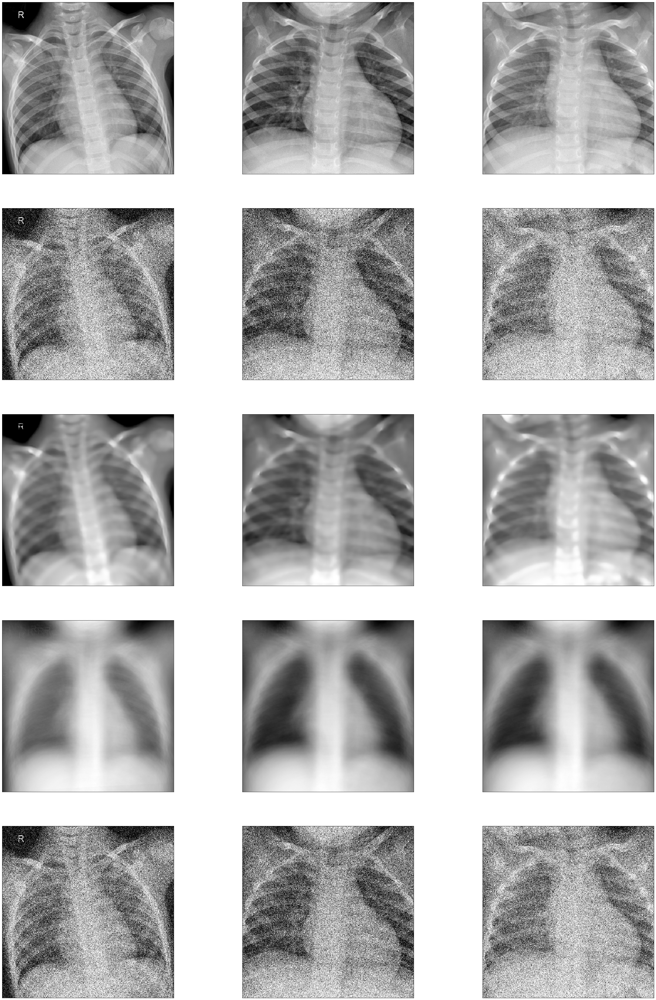

In [29]:
from skimage.restoration import (denoise_tv_chambolle, denoise_bilateral,
                                 denoise_wavelet, estimate_sigma )
n = 3
plt.figure(figsize=(40, 60))
for i in range(n):
    i=i+1
    # display original
    # display original
    ax = plt.subplot(5, n, i)
    plt.imshow(X_test[i].reshape(SET_SIZE, SET_SIZE))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    ax = plt.subplot(5, n, i + n)
    plt.imshow(X_test_noisy[i].reshape(SET_SIZE, SET_SIZE))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # display reconstruction
    ax = plt.subplot(5, n, i +n+n)
    plt.imshow(decoded_imgs[i].reshape(SET_SIZE, SET_SIZE))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    ax = plt.subplot(5, n, i +n+n+n)
    plt.imshow(decoded_imgs_stand[i].reshape(SET_SIZE, SET_SIZE))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
    ax = plt.subplot(5, n, i +n+n+n+n)
    plt.imshow(cv2.fastNlMeansDenoising(np.uint8(X_test_noisy[i].reshape(SET_SIZE, SET_SIZE)*255),None,10,7,21))
    #plt.set_title('Wavelet denoising')
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    
plt.show()